# Diffusion Lens
## Introduction

🔎 Diffusion Lens is a technique to observe the inner computations of Diffusion Models, developed by Michael Toker in his paper, *Diffusion Lens: Interpreting Text Encoders in Text-to-Image Pipelines* ([Project Website](https://tokeron.github.io/DiffusionLensWeb/), [ACL Paper](https://aclanthology.org/2024.acl-long.524/)).

> **Colab: [exercises](https://colab.research.google.com/github/ndif-team/nnsight-website/blob/docs/source/notebooks/tutorials/probing/diffusion_lens.ipynb)**


Diffusion models produce images from text by first encoding text into numerical embeddings, which then guide image generation through a diffusion denoising process. Text encoder models can be trained along with the diffusion model, or models may use pretrained text encoders like CLIP.

Diffusion Lens works by generating images from the text encoder's intermediate representations during text embedding, allowing us to visualize how the model  encodes text as its computations move throughout its layers. The original Diffusion Lens paper revealed some fascinating insights into the text encoding process, finding differences in encoding between types of text encoders and the process of encoding different complexities of prompts. For instance, the authors observed that text encoders tend to embed common knowledge at earlier layers than uncommon knowledge. Another key finding was that different text encoders can encode the same prompt in different orders. For compound prompts with two nouns, they found that T5 and CLIP text encoders approached the encoding process differently.

![Compound Prompt Example](https://tokeron.github.io/DiffusionLensWeb/static/images/encoders.png)
**Text encoders differ in computation process (Toker et al.):** Diffusion models prompted with a compound prompt tend to represent concepts individually before combining them in the final embedding, and that the order of concepts introduced can vary between text encoding models (T5 vs CLIP). While processing a text prompt, T5  tended to represent the second noun first, while CLIP tended to represent the first noun first.

Let's test to see if this holds using NNsight and Diffusion Lens! We will use the prompt `"A few people are in the ocean splashing around"` to see if we can replicate the results from the paper. We will use Stable Diffusion 1.5 which uses a CLIP encoder and Deep Floyd which uses a T5 encoder. We will also explore the behavior of a few other models that weren't investigated in the paper.


## Setup

If you are running in Colab, install NNsight and ensure you are connected to GPU. NOTE: Colab built-in T4 GPUs will only have enough GPU RAM to run one model at a time. You will need to disconnect and restart the session to run multiple models. After restarting the session, you can rerun this setup section and then skip ahead to the model that you'd like to run.

In [1]:
from IPython.display import clear_output
import torch
try:
    import google.colab
    is_colab = True
    if torch.cuda.is_available():
        print("GPU is connected")
    else:
        print("GPU is not connected: Please restart session with a GPU")

except ImportError:
    is_colab = False

if is_colab:
    !pip install --no-deps nnsight
    !pip install msgspec python-socketio[client]
    !pip install ftfy

clear_output()

Let's do our imports. We will be using the `DiffusionModel` class of NNsight for this exercise.

In [2]:
from nnsight.modeling.diffusion import DiffusionModel
import matplotlib.pyplot as plt
from math import ceil, sqrt
import PIL
import torch

## Stable Diffusion 1.5 (CLIP encoder)


### Load Model

We will start with the Stable Diffusion 1.5 model, which uses the CLIP text encoder. We're going to apply the diffusion lens technique to visualize how CLIP is processing the prompt across its layers.

Let's instantiate the model and define some parameters for the experiment, including our prompt. We can use NNsight's `DiffusionModel` wrapper to load in the model from HuggingFace, which we will send to the GPU using `dispatch = True`.

In [ ]:
model = DiffusionModel(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    dispatch=True
).to("cuda")

In [8]:
SEED = 17 # random seed for image generation: play around with it and see if it changes results!
STEP_SIZE = 1 # number of steps between layers for our experiment

In [4]:
prompt = "A few people are in the ocean splashing around"

### Run Diffusion Lens



Now we have the model ready for our experiment.

Diffusion Lens works by processing each of the intermediate text encoder layer outputs through the final layer norm to visualize how the model is progressively refining the text embedding for the diffusion process.

Let's try implementing this in `nnsight`.

In [ ]:
layers = range(0, model.text_encoder.config.num_hidden_layers, STEP_SIZE)
images = []

for layer in layers:
    print(f"Generating Diffusion Lens for skip_layers {model.text_encoder.config.num_hidden_layers - layer - 1}")

    # We will use NNsight's .generate() method for image generation.
    # We're specifying our prompt and the random generation seed.
    with model.generate(
        prompt,
        seed=SEED
        ):

        # replace the final_layer_norm input with the text_encoder's output for the layer.
        hidden_state = model.text_encoder.text_model.encoder.layers[layer].output[0]
        model.text_encoder.text_model.final_layer_norm.input = hidden_state

        # Save the generated image and add it to our collection
        image = model.output.images[0].save()
        images.append(image)

if not isinstance(images[0], PIL.Image.Image):
    images = [image.value for image in images]

### Visualize Results

Great, now our Diffusion Lens experiment has finished running! Let's plot the images and see how the CLIP text encoder is processing the input across layers.

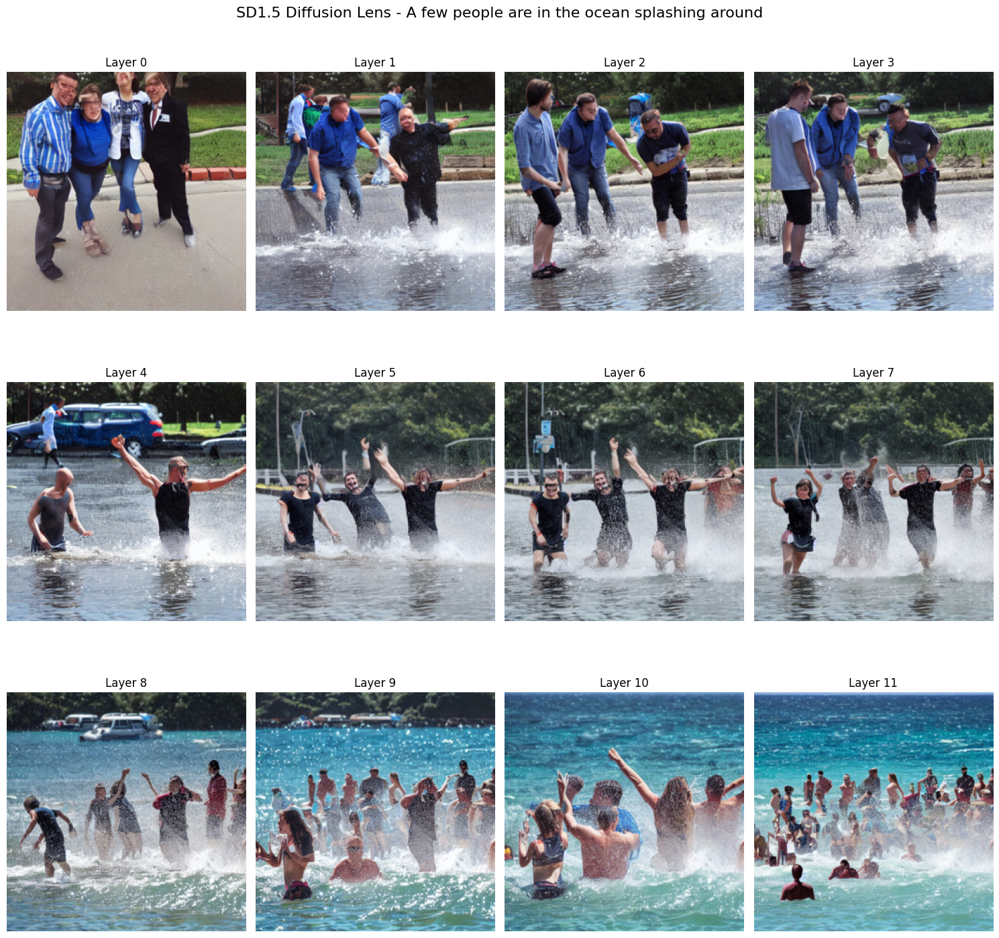

In [10]:
# Calculate grid dimensions
num_images = len(images)
grid_size = ceil(sqrt(num_images))
fig, axes = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes = axes.flatten()

# Add a main title to the figure
fig.suptitle(f"SD1.5 Diffusion Lens - {prompt}", fontsize=16)

# Display images in a grid
for i, (layer, image) in enumerate(zip(layers, images)):
    if i < len(axes):
        axes[i].imshow(image.resize((256, 256)))
        axes[i].set_title(f"Layer {layer}")
        axes[i].axis('off')

# Hide any unused subplots
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Cool! As reported in the diffusion lens paper, the CLIP encoder started by representing people (the first noun in the prompt) and then added water/ocean (the second noun in the prompt). Let's next try with the T5  text encoder to see if things change.

## Deep Floyd (T5 encoder)


*NOTE: If running on Colab T4 GPUs, you will need to disconnect and restart the session to load in this model. There isn't enough GPU RAM to load both models.*

Once you restart the session, rerun the "Setup" section and then you can skip ahead to this section to get the Deep Floyd results.

### Load Model

In [ ]:
model = DiffusionModel(
    "DeepFloyd/IF-I-L-v1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    dispatch=True
).to("cuda")

print(model)

In [4]:
prompt = "A few people are in the ocean splashing around"

In [5]:
SEED = 128998123
STEP_SIZE = 2

### Run Diffusion Lens

Now that we have Deep Floyd loaded, let's set up the diffusion lens experiment again. This code is pretty similar

In [ ]:
import ftfy
layers = range(0, model.text_encoder.config.num_hidden_layers - 1, STEP_SIZE)
images = []

for layer in layers:
    print(f"Generating Diffusion Lens for skip_layers {model.text_encoder.config.num_hidden_layers - layer}")
    with torch.no_grad():
        with model.generate(
            prompt,
            seed=SEED
        ):
            hidden_states = model.text_encoder.encoder.block[layer].output[0]
            model.text_encoder.encoder.final_layer_norm.input = hidden_states

            image = model.output.images[0].save()
            images.append(image)

if not isinstance(images[0], PIL.Image.Image):
    images = [image.value for image in images]

### Visualize Results

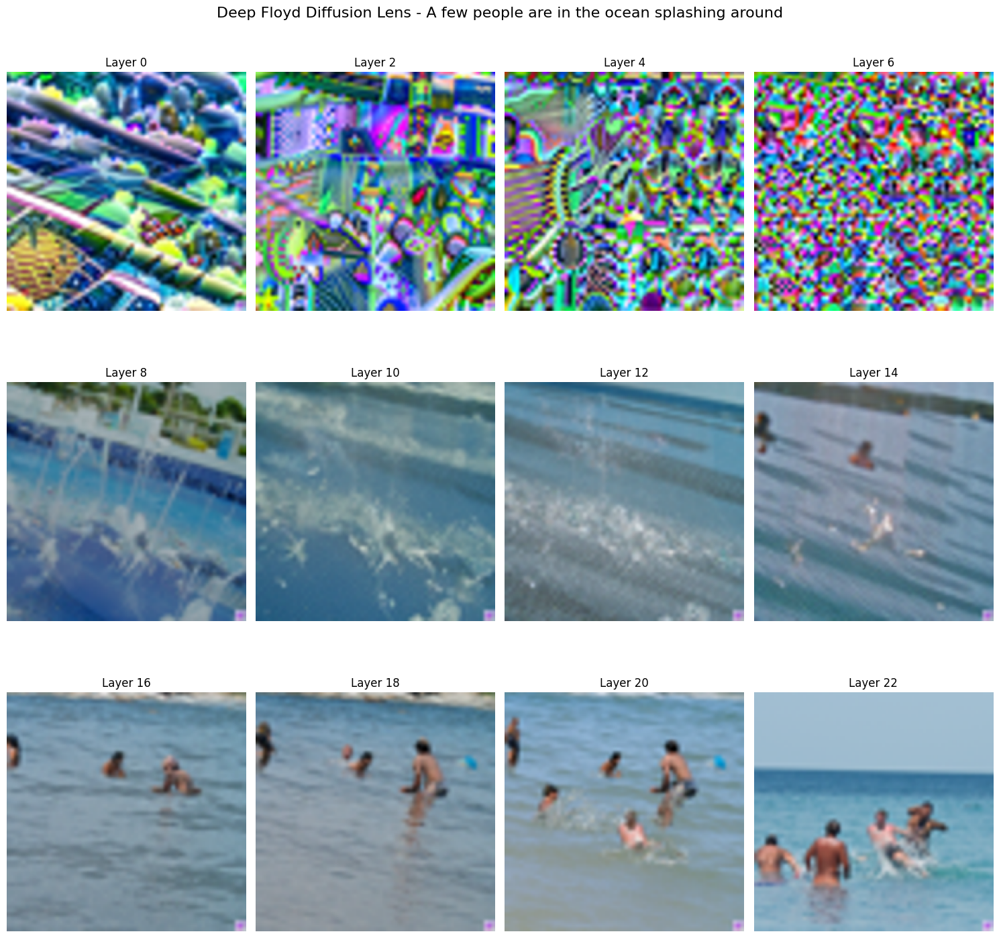

In [7]:
# Calculate grid dimensions
num_images = len(images)
grid_size = ceil(sqrt(num_images))
fig, axes = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes = axes.flatten()

# Add a main title to the figure
fig.suptitle(f"Deep Floyd Diffusion Lens - {prompt}", fontsize=16)

# Display images in a grid
for i, (layer, image) in enumerate(zip(layers, images)):
    if i < len(axes):
        axes[i].imshow(image.resize((256, 256)))
        axes[i].set_title(f"Layer {layer}")
        axes[i].axis('off')

# Hide any unused subplots
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Interesting! The T5 encoder first started with ocean (the second noun) and then added people (the first noun), exhibiting how CLIP and T5 differ in their encoding processes.

## BONUS: Stable Diffusion XL (Two CLIP encoders)

### Load Model

We will start with the Stable Diffusion XL model, which uses two CLIP encoders. Let's define some parameters for the experiment and instantiate the model.

In [ ]:
model = DiffusionModel(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
    dispatch=True
).to("cuda")

In [ ]:
prompt = "A few people are in the ocean splashing around"

In [4]:
ADD_LAYER_NORM = True # SDXL doesn't automatically use the layer norm, so we have some logic to add it in here
SEED = 17
NUM_INFERENCE_STEPS = 100
STEP_SIZE = 2

### Run Diffusion Lens

Great, we have the SDXL model ready for our experiment. SDXL is a little weird, so the diffusion lens code is a little more complicated. We need to mask the first text encoder to isolate the effects of the second text encoder. We also need to manually add in the layer norm, because SDXL doesn't include it automatically. Try setting `LAYER_NORM = False` to see the effects of this!

In [ ]:
# Defines the hidden states to embed, we skip the last layer because SDXL ignores it
layers = range(0, model.text_encoder_2.config.num_hidden_layers - 1, STEP_SIZE)
images = []

# Create an empty prompt input for the first text encoder
# This will be used to mask out the original text input, allowing us to isolate
# the effect of injecting hidden states from the second text encoder
mask_input = model.tokenizer(
    '',  # Empty string as we want to mask out the original text
    padding="max_length",
    max_length=model.tokenizer.model_max_length,
    truncation=True,
    return_overflowing_tokens=False,
    return_length=False,
    return_tensors="pt"
).to(model.device)

for layer in layers:
    print(f"Generating Diffusion Lens for skip_layers {model.text_encoder_2.config.num_hidden_layers - layer}")
    with model.generate(
        prompt,
        num_inference_steps=40,
        seed=SEED
        ):

        # Replace the input to the first text encoder with our empty mask
        # This effectively nullifies the contribution of the first text encoder
        model.text_encoder.input = mask_input['input_ids']

        if ADD_LAYER_NORM:

            hidden_state = model.text_encoder_2.text_model.encoder.layers[layer].output[0]

            # SDXL grabs the penultimate hidden state from the text encoder
            model.text_encoder_2.text_model.encoder.layers[-2].output[0][:] = model.text_encoder_2.text_model.final_layer_norm(hidden_state)[0][:]
        else:
            # SDXL grabs the penultimate hidden state from the text encoder
            model.text_encoder_2.text_model.encoder.layers[-2].output[0][:] = model.text_encoder_2.text_model.encoder.layers[layer].output[0][:]

        # Save the generated image and add it to our collection
        image = model.output.images[0].save()
        images.append(image)

if not isinstance(images[0], PIL.Image.Image):
    images = [image.value for image in images]


### Visualize Results

Great, now let's visualize this by plotting the image created from the processed intermediate layers.

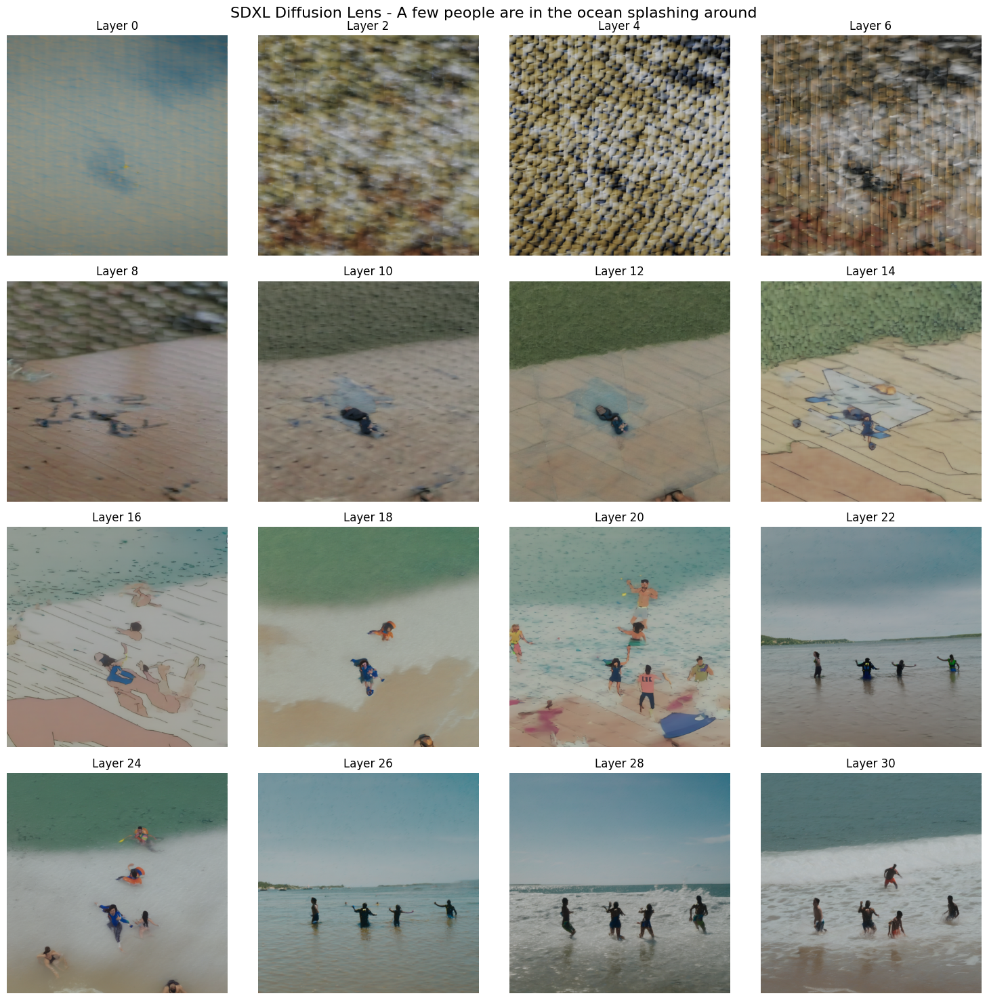

In [7]:
# Calculate grid dimensions
num_images = len(images)
grid_size = ceil(sqrt(num_images))
fig, axes = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes = axes.flatten()

# Add a main title to the figure
fig.suptitle(f"SDXL Diffusion Lens - {prompt}", fontsize=16)

# Display images in a grid
for i, (layer, image) in enumerate(zip(layers, images)):
    if i < len(axes):
        axes[i].imshow(image.resize((512, 512)))
        axes[i].set_title(f"Layer {layer}")
        axes[i].axis('off')

# Hide any unused subplots
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Interesting! SDXL starts by making the ocean, then the people. This is in contrast to the other CLIP encoder that represented the first noun in the prompt first. Try playing around with the settings to see if you can change how the encoder is operating.

## BONUS: FLUX Schnell (CLIP and T5 XXL encoders)

### Load Model

Let's try implementing diffusion lens on the FLUX Schnell Model, which uses both CLIP and T5 XXL encoders. We'll once again define some parameters and load in the model.

*NOTE: FLUX is too large for Google Colab T4s, so you will need to run this locally on your own GPU or use a paid Colab plan to run this section.*

In [ ]:
SEED = 17
NUM_INFERENCE_STEPS = 1
STEP_SIZE = 2
GUIDANCE_SCALE = 0.0
HEIGHT = 512
WIDTH = 512

In [ ]:
model = DiffusionModel(
    "black-forest-labs/FLUX.1-schnell", torch_dtype=torch.bfloat16, dispatch=True
).to('cuda')

Let's use the example prompt from FLUX to see how it is encoded with diffusion lens.

In [ ]:
prompt = "Penguin playing chess at a wooden table in a snowy landscape."

### Run Diffusion Lens

Let's run the Diffusion Lens experiment again. CLIP is the first text encoder, while T5 is the second. We're going to mask out the effects of the CLIP encoder to isolate the T5 encoder. Let's see if the pattern that T5 represents the prompt's nouns in reverse order holds.




In [ ]:
layers = range(0, model.text_encoder_2.config.num_hidden_layers - 1, STEP_SIZE)
images = []

mask_input = model.tokenizer(
    '',
    padding="max_length",
    max_length=model.tokenizer.model_max_length,
    truncation=True,
    return_overflowing_tokens=False,
    return_length=False,
    return_tensors="pt"
).to(model.device)

for layer in layers:
    print(f"Generating Diffusion Lens for skip_layers {model.text_encoder_2.config.num_hidden_layers - layer}")
    with torch.no_grad():
        with model.generate(
            prompt,
            guidance_scale=0.0,
            height=512,
            width=512,
            num_inference_steps=1,
            seed=17
        ):
            model.text_encoder.input = mask_input['input_ids']

            model.text_encoder_2.encoder.final_layer_norm.input = model.text_encoder_2.encoder.block[layer].output[0]

            image = model.output.images[0].save()
            images.append(image)

if not isinstance(images[0], PIL.Image.Image):
    images = [image.value for image in images]

Generating Diffusion Lens for skip_layers 24


100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Generating Diffusion Lens for skip_layers 22


100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


Generating Diffusion Lens for skip_layers 20


100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Generating Diffusion Lens for skip_layers 18


100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


Generating Diffusion Lens for skip_layers 16


100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Generating Diffusion Lens for skip_layers 14


100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


Generating Diffusion Lens for skip_layers 12


100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Generating Diffusion Lens for skip_layers 10


100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Generating Diffusion Lens for skip_layers 8


100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


Generating Diffusion Lens for skip_layers 6


100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


Generating Diffusion Lens for skip_layers 4


100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


Generating Diffusion Lens for skip_layers 2


100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


### Visualize Results
Let's see how FLUX Schnell processed the penguin prompt.

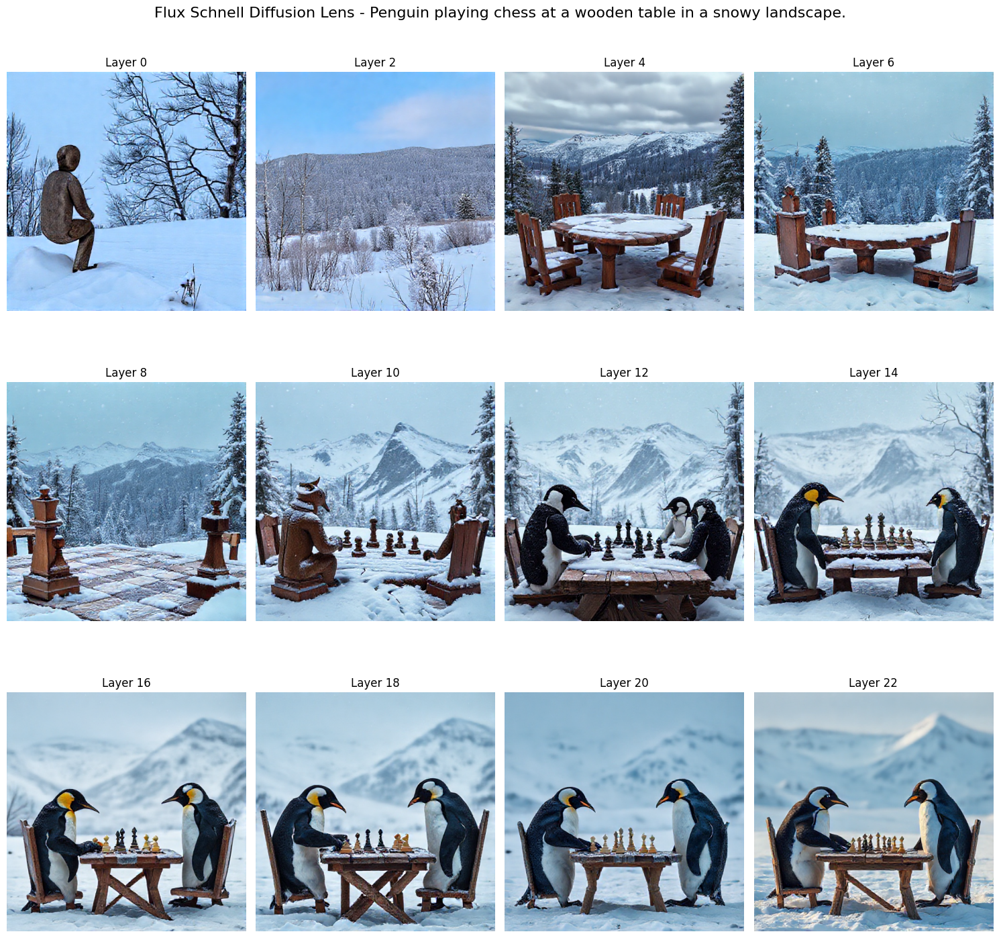

In [ ]:
# Calculate grid dimensions
num_images = len(images)
grid_size = ceil(sqrt(num_images))
fig, axes = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes = axes.flatten()

# Add a main title to the figure
fig.suptitle(f"Flux Schnell Diffusion Lens - {prompt}", fontsize=16)

# Display images in a grid
for i, (layer, image) in enumerate(zip(layers, images)):
    if i < len(axes):
        axes[i].imshow(image)
        axes[i].set_title(f"Layer {layer}")
        axes[i].axis('off')

# Hide any unused subplots
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
# Adjust layout to make room for the title
# plt.subplots_adjust(top=0.9)
plt.show()

Fascinating! FLUX Schnell creates the snowy landscape first, then the table, chess board, and finally the penguins. This supports our hypothesis that T5 models represent nouns in compound prompts in reverse order.